# MM Project - Waves of pursuit and evasion in predator-prey systems_ 1D Explicit
## Golubeva Ekaterina  & Mengxiao Wang

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from copy import copy
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

### Parameter Setting

In [ ]:
k = 100 # carrying capacity
a = 1 # birth rate of prey
b = 0.1 # death rate of prey due to predation
c = 0.02 # factor that describes how many eaten preys give birth to a new predator
d = 0.5 # natural death rate of predator
D_u = 0.1 # diffusion term for prey
D_v = 0.1 # diffusion term for predator

### Discrete time and space

In [38]:
dt = 0.5 #time step
end_time = 150 #total time
NT = int(end_time/dt) #number of time step
t = np.arange(0, end_time+dt, dt) # time postion

dx = 0.5 #space step
L = 100 # length of the spetial segment
NX = int(L/dx) # number of steps
x = np.arange(0, L+dx, dx) # space position

### Create prey and predator grids

In [39]:
n = len(x) 
m = len(t)
u = np.zeros((n,m))
v = np.zeros((n,m))

### Inital Configuration 


In [8]:
u0=20*np.exp(-0.01*(x-45)**2)
v0=10*np.exp(-0.02*(x-25)**2)

u[:,0] = u0
v[:,0] = v0

### Solve PDE with eplicit method (Forward in time, symmetric in space)

In [40]:
F1 = D_u*(dt/dx**2)
F2 = D_v*(dt/dx**2)

for j in range(1,m): #loop through time steps
    for i in range(n): #loop through space steps 
        u[i,j] = (a*u[i%n,j-1] * (1-u[i%n,j-1]/k)- b*v[i%n,j-1]*u[i%n,j-1])*dt + F1*(u[(i+1)%n,j-1]-2*u[i%n,j-1]+u[(i-1)%n,j-1]) + u[i%n,j-1]
        v[i,j] = (v[i%n,j-1]*(c*u[i%n,j-1]-d))*dt + F2*(v[(i+1)%n,j-1]-2*v[i%n,j-1]+v[(i-1)%n,j-1]) + v[i%n,j-1]
        

### Result Visualisation 

In [34]:
def image(u_k, v_k, k):
    # Clear the current plot figure
    plt.clf()

    plt.title(f" Population at t = {k*dt:.3f} unit time")
    plt.xlabel("x")
    plt.ylabel("y")

    # This is to plot u_k (u at time-step k)
    plt.plot(x,u_k,color = 'xkcd:black', label = 'Prey')
    plt.plot(x,v_k,color = 'xkcd:red', label = 'Predator')
    plt.xlabel('distance [m]')
    plt.ylabel('population')
    plt.legend()

    return plt

In [35]:
def animate(k):
    image(u[:,k],v[:,k],k)

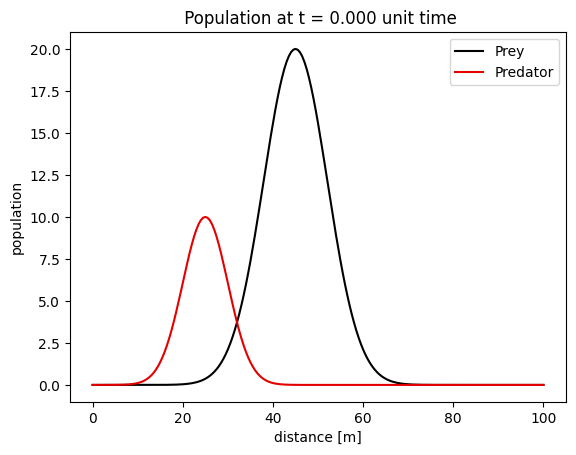

In [36]:
anim = animation.FuncAnimation(plt.figure(), animate, interval=10, frames= m, repeat=False)

display(HTML(anim.to_jshtml()))